#**Tutorial: Map & Validate Pedestrian Flow Estimates (City of Sydney Example)**
Cities increasingly need network-level understanding of walking to prioritise footpath upgrades, assess access to transit, and balance place-making with movement. This Python tutorial maps precomputed link-based pedestrian flows at the sidewalk level and validates them against selected City of Sydney counter sites. We do not build an OD matrix or estimate a route-choice model here; the flows come from a stochastic assignment using an approximated OD walking demand matrix with empirically estimated route preferences (see paper below).

**Who this is for?** Transport/GIS practitioners in government and consultancies, and students working with active-transport datasets.

**Prerequisites:** Basic Python.

*Lilasathapornkit, Tanapon and Nourmohammadi, Fatemeh and Saberi, Meead, **Understanding Walking Route Choice Preferences and Pedestrian Network Flows: From Individual Trajectories to City-Scale Patterns Using Empirical Data from Sydney**. Available at SSRN: https://ssrn.com/abstract=5164102 or http://dx.doi.org/10.2139/ssrn.5164102*

For enquries: Meead Saberi (meead.saberi@unsw.edu.au) at UNSW Research Centre for Integrated Transport Innovation (rCITI), School of Civil and Environmental Engineering

# **Data & network context**
This notebook loads estimated link-level pedestrian flows from a CSV and produces a legible city-scale map, then validates against City of Sydney observed pedestrian counts across limited sites. The CSV includes *flow* (daily pedestrians per link) and *geojson* (the link geometry as a GeoJSON-like string); optional fields such as node IDs or street names are read if present. The sidewalk network comprises directed links for footpaths, walkways and formal crossings, with geometry based on OpenStreetMap and augmented where key pedestrian links matter; informal/mid-block crossings are excluded in the underlying study. Validation uses City of Sydney counts from October 2023. Data are stored and mapped in EPSG:4326 (lat/long), and nearest-link distances are computed in EPSG:3857 (metres).

# **Setup**
Install the geospatial stack and set up the core imports for data handling and mapping. We’ll use GeoPandas and Shapely for geometry operations, Folium to build a lightweight, shareable web map, and Branca for colour scales. If you’ve already run the notebook once, you can skip the pip install cell on subsequent runs to save time.

In [2]:
# Colab setup (run once)
!pip install geopandas shapely folium branca

import json
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import shape
import folium
import branca.colormap as cm

# **Loading the data**

You import the network CSV and parse link geometries from the embedded GeoJSON string into a GeoDataFrame (EPSG:4326). Two quick checks—row count and geometry type—catch most ingestion issues before mapping or joining. Use the Drive download URL format to avoid CSV parser errors. Ensuring consistent geometry prevents empty maps and supports later steps such as CRS transforms and nearest-link joins.

In [5]:
# Load CSV from Google Drive
# Original share link:
# https://drive.google.com/file/d/1isc_B4JssL4mxxwl6tvqpGXLws993vcT/view?usp=sharing

file_id = "1isc_B4JssL4mxxwl6tvqpGXLws993vcT"
raw_url = f"https://drive.google.com/uc?export=download&id={file_id}"

df = pd.read_csv(raw_url)

# arse embedded GeoJSON geometry into shapely
def parse_geojson(feature_str):
    s = str(feature_str).strip().strip("'").strip('"')
    try:
        f = json.loads(s)   # standard JSON
    except json.JSONDecodeError:
        import ast
        f = ast.literal_eval(s)  # fallback if it's Python dict-style
    return shape(f["geometry"])

df["geometry"] = df["_geojson"].apply(parse_geojson)
gdf = gpd.GeoDataFrame(df, geometry="geometry", crs="EPSG:4326")

print("Loaded rows:", len(gdf))
print("Geometry types:", gdf.geometry.geom_type.unique())

# After creating gdf
print("Loaded rows:", len(gdf))
print("Geometry types:", gdf.geometry.geom_type.unique())

# Show first 10 rows
print(gdf.head(10))

Loaded rows: 4608
Geometry types: ['LineString']
Loaded rows: 4608
Geometry types: ['LineString']
                                            _geojson          flow  cost  \
0  {"type":"Feature","properties":{"flow":49531.5...  49531.569102     0   
1  {"type":"Feature","properties":{"flow":6280.26...   6280.261053     0   
2  {"type":"Feature","properties":{"flow":16754.4...  16754.462682     0   
3  {"type":"Feature","properties":{"flow":250.645...    250.645729     0   
4  {"type":"Feature","properties":{"flow":35285.4...  35285.498411     0   
5  {"type":"Feature","properties":{"flow":555.072...    555.072816     0   
6  {"type":"Feature","properties":{"flow":4844.56...   4844.564704     0   
7  {"type":"Feature","properties":{"flow":1908.70...   1908.702375     0   
8  {"type":"Feature","properties":{"flow":645.739...    645.739312     0   
9  {"type":"Feature","properties":{"flow":36106.6...  36106.683294     0   

              type  fid        v/c  \
0  pedestrian_path    0  16

# **Map design: making flow patterns legible at a glance**

Here, we map links with discrete “dusk” colours to form clear bands of activity rather than a mushy gradient, and width scaling (thicker = busier), as well as opacity scaling (denser = more opaque) so quiet links fade and corridors pop. These choices align with how people often visually parse complex networks.

Expect broad spines along George St and around major hubs; thinner feeders in local streets. Where the map shows very high stroke weights, your are typically looking at high-choice-probability walking routes plus high OD pedestrian loading.

In [4]:
# Color scale (DISCRETE "dusk") & width/opacity scaling by flow

flow_min, flow_max = float(gdf["flow"].min()), float(gdf["flow"].max())

# Discrete bins for line colouring.
bins = [0, 10, 1000, 5000, 10000, 50000, flow_max]

# DUSK-like palette: deep purple → blue → teal → soft green
# Must be len(colors) == len(bins) - 1
colors = ["#b8e186", "#66c2a5", "#208f8f", "#3b4cc0", "#45227c", "#2c105c"]

# Discrete colormap for LINES
colormap = cm.StepColormap(
    colors,
    vmin=min(bins),
    vmax=max(bins),
    index=bins,
    caption=None  # custom legend below
)

def width_from_flow(flow, min_w=1.5, max_w=12.0):
    if flow_max == flow_min:
        return (min_w + max_w) / 2
    return float(np.interp(flow, [flow_min, flow_max], [min_w, max_w]))

def alpha_from_flow(flow, min_a=0.45, max_a=0.95):
    if flow_max == flow_min:
        return (min_a + max_a) / 2
    return float(np.interp(flow, [flow_min, flow_max], [min_a, max_a]))

# Helper to add any LineString/MultiLineString to a folium map
def add_lines_to_map(m, geom, flow):
    flow_int = int(round(flow))  # round to nearest integer for tooltip
    if geom.is_empty:
        return
    if geom.geom_type == "LineString":
        lines = [geom]
    elif geom.geom_type == "MultiLineString":
        lines = list(geom.geoms)
    else:
        return

    w = width_from_flow(flow)
    a = alpha_from_flow(flow)

    for line in lines:
        # Handles 2D/3D coords by taking first two (lon, lat) -> (lat, lon)
        coords = [(c[1], c[0]) for c in line.coords]
        folium.PolyLine(
            coords,
            color=colormap(flow),   # snapped to dusk bins
            weight=w,               # width scales with flow
            opacity=a,              # opacity scales with flow
            tooltip=f"Flow: {flow_int:,}"
        ).add_to(m)

# Ensure lines_only exists
lines_only = gdf[gdf.geometry.geom_type.isin(["LineString", "MultiLineString"])]

# Build the map FIRST
m = folium.Map(
    location=[-33.8688, 151.2093],
    zoom_start=14,
    tiles="cartodbpositron"
)

# Add your lines
for _, row in lines_only.iterrows():
    add_lines_to_map(m, row.geometry, row["flow"])

# Discrete legend that REFLECTS THE BINS
def fmt_k(n):
    n = float(n)
    return f"{int(round(n/1000))}k" if n >= 1000 else str(int(round(n)))

labels = []
for i in range(len(bins) - 1):
    if i < len(bins) - 2:
        labels.append(f"{fmt_k(bins[i])} – {fmt_k(bins[i+1])}")
    else:
        labels.append(f"{fmt_k(bins[i])}+")

legend_html = """
<div style="position: fixed; top: 20px; right: 20px;
     z-index:9999; font-size:14px; background-color:white;
     padding:10px; border:2px solid grey; border-radius:5px;">
     <b>Estimated Daily<br>Pedestrian Flow</b><br>
"""
for color, label in zip(colors, labels):
    legend_html += f'<i style="background:{color};width:18px;height:18px;display:inline-block;margin-right:8px;opacity:0.9"></i>{label}<br>'
legend_html += "</div>"
m.get_root().html.add_child(folium.Element(legend_html))

# Auto-fit to data extent
minx, miny, maxx, maxy = gpd.GeoSeries(lines_only["geometry"]).total_bounds
m.fit_bounds([[miny, minx], [maxy, maxx]])

m  # or: from IPython.display import display; display(m)
# m.save("/content/sydney_sidewalk_flows.html")


# **Estimated pedestrian flow distribution (first-pass sense check)**
Before moving on to further spatial analysis or validation, we first plot a histogram of the estimated pedestrian flows as a quick sense-check. The distribution is strongly right-skewed. The median is 2,914 pedestrians per day while the mean is 10,189 pedestrians per day, indicating that a small set of corridors carries a disproportionate share of walking consistent with desire lines and major corridors such as George Street.

The upper tail is concentrated. The busiest 10% of links exceed 29,000 pedestrians per day, the top 5% exceed 40,800, and the top 1% exceed 71,900. At the other end, many links carry very low volumes including fewer than 10 pedestrians per day and some have zero flow. The log-scale view confirms a long lower tail made up of peripheral links, alternative paths with tiny route assignment probabilities, or near-isolated segments driven by zero OD demand. Overall, the shape looks plausible for a CBD network.

Links with valid flow values: 4,608
Min=0, Median=2,914, Mean=10,189, Max=152,337
P90=29,346, P95=40,758, P99=71,910


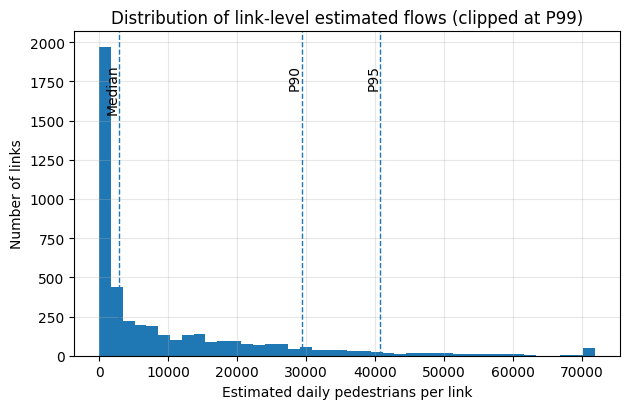

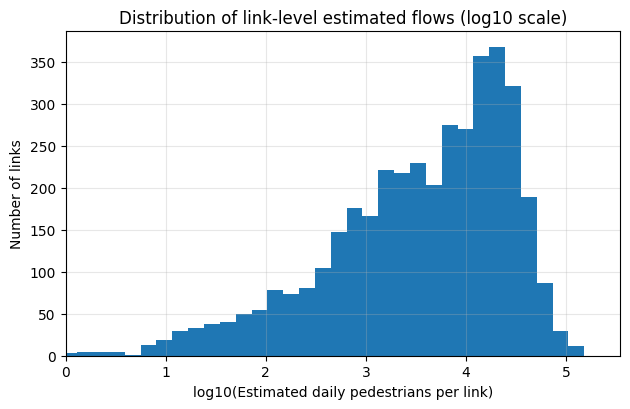

In [6]:
# Distribution of link-level estimated flows (histogram)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Use line features only (matches your mapping subset)
gdf_lines = gdf[gdf.geometry.geom_type.isin(["LineString", "MultiLineString"])].copy()

# Clean the 'flow' column
flows = pd.to_numeric(gdf_lines["flow"], errors="coerce").dropna()

print(f"Links with valid flow values: {len(flows):,}")
print(f"Min={flows.min():,.0f}, Median={flows.median():,.0f}, Mean={flows.mean():,.0f}, Max={flows.max():,.0f}")
p90, p95, p99 = np.percentile(flows, [90, 95, 99])
print(f"P90={p90:,.0f}, P95={p95:,.0f}, P99={p99:,.0f}")

# Plot 1: Linear histogram (clipped at P99 to improve readability)
clip_max = p99  # change to p95 if you want stronger clipping
flows_clipped = flows.clip(upper=clip_max)

plt.figure(figsize=(6.4, 4.2))
plt.hist(flows_clipped, bins="fd")  # Freedman–Diaconis for sensible bin width
plt.xlabel("Estimated daily pedestrians per link")
plt.ylabel("Number of links")
plt.title("Distribution of link-level estimated flows (clipped at P99)")
plt.grid(True, alpha=0.3)
# Reference lines for key percentiles (on the clipped scale)
for x, lab in [(flows.median(), "Median"), (p90, "P90"), (p95, "P95")]:
    if x <= clip_max:
        plt.axvline(x, linestyle="--", linewidth=1)
        plt.text(x, plt.gca().get_ylim()[1]*0.9, lab, rotation=90, va="top", ha="right")
plt.tight_layout()
plt.show()

# Plot 2: Log-scale view to show the heavy tail
SHOW_LOG_VIEW = True
if SHOW_LOG_VIEW:
    flows_pos = flows[flows > 0]  # log needs positive values
    plt.figure(figsize=(6.4, 4.2))
    plt.hist(np.log10(flows_pos), bins="fd")
    plt.xlim(0, None)
    plt.xlabel("log10(Estimated daily pedestrians per link)")
    plt.ylabel("Number of links")
    plt.title("Distribution of link-level estimated flows (log10 scale)")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


# **First validation pass (Central Station area sites)**
We compare observed daily counts at four locations near Central Station to the nearest modelled link. To avoid “nearest by degrees” errors, everything is projected to EPSG:3857 (metres). Using sjoin_nearest returns the matched link and a diagnostic distance (dist_m); large distances flag weak proxies—for example, plaza counters near multi-link hubs.

**How to read the scatter?**

Points below the 1:1 line indicate underestimation at those sites, common near station forecourts where complex pedestrian flows disperse. The paper’s broader validation across City of Sydney shows promising network-level fit (R² ≈ 0.79; MAPE ≈ 27%) with location-specific variance, so per-site deviations in this small sample are entirely plausible.

Saved /content/ped_counts.csv and /content/ped_counts.geojson

Nearest-link matches:


,site_id,name,period,observed,est_flow,dist_m,abs_err,ape_%,geometry
0,103,Chalmers St @ Devonshire (Site 103),Oct 2023,13566,4093.0,7.8,9473.0,69.83,POINT (151.207 -33.88561)
1,69,Foveaux St btw Terry & Elizabeth (Site 69),Oct 2023,17784,3581.0,3.3,14203.0,79.87,POINT (151.20858 -33.88358)
2,45,George St btw Barlow & Hay (Site 45),Oct 2023,20274,21739.0,4.6,1465.0,7.23,POINT (151.2051 -33.88003)
3,7,Railway Sq btw Quay & Harris (Site 7),Oct 2023,46674,30004.0,10.2,16670.0,35.71,POINT (151.20341 -33.88342)



MAPE across these 4 sites: 48.16%


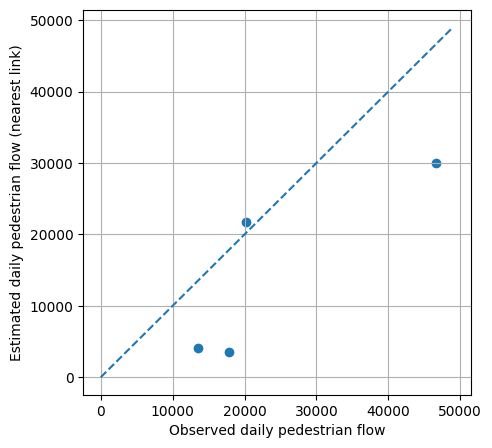

In [7]:
# Create the 4 sites as CSV + GeoJSON: Observed pedestrian count data are obtained from City of Sydney Data Hub
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt

sites = [
    {
        "site_id": 103,
        "name": "Chalmers St @ Devonshire (Site 103)",
        "lat": -33.88560623741054, "lon": 151.2069982535855,
        "observed": 13566, "period": "Oct 2023"
    },
    {
        "site_id": 69,
        "name": "Foveaux St btw Terry & Elizabeth (Site 69)",
        "lat": -33.88357826979872, "lon": 151.20858136680698,
        "observed": 17784, "period": "Oct 2023"
    },
    {
        "site_id": 45,
        "name": "George St btw Barlow & Hay (Site 45)",
        "lat": -33.88002565281318, "lon": 151.20509666345032,
        "observed": 20274, "period": "Oct 2023"
    },
    {
        "site_id": 7,
        "name": "Railway Sq btw Quay & Harris (Site 7)",
        "lat": -33.88342098743997, "lon": 151.20340849188324,
        "observed": 46674, "period": "Oct 2023"
    },
]

df_sites = pd.DataFrame(sites)
gdf_sites = gpd.GeoDataFrame(
    df_sites,
    geometry=gpd.points_from_xy(df_sites["lon"], df_sites["lat"]),
    crs="EPSG:4326"
)

# Save files
csv_path = "/content/ped_counts.csv"
geojson_path = "/content/ped_counts.geojson"
df_sites.to_csv(csv_path, index=False)
gdf_sites.to_file(geojson_path, driver="GeoJSON")
print(f"Saved {csv_path} and {geojson_path}")

# Prepare network (lines only)
gdf_lines = gdf[gdf.geometry.geom_type.isin(["LineString", "MultiLineString"])].copy()
if gdf_lines.crs is None:
    gdf_lines.set_crs("EPSG:4326", inplace=True, allow_override=True)

# Work in metres for nearest search
gdf_lines_m = gdf_lines.to_crs(3857)
gdf_sites_m = gdf_sites.to_crs(3857)

# Nearest link per site
# Requires GeoPandas >= 0.10
joined_m = gpd.sjoin_nearest(
    gdf_sites_m,
    gdf_lines_m[["geometry", "flow"]],
    how="left",
    distance_col="dist_m"
)

# Back to WGS84 for readability
joined = joined_m.to_crs(4326)

# Pull flows and compute simple error metrics
joined["est_flow"] = joined["flow"].astype(float)
joined["abs_err"] = (joined["observed"] - joined["est_flow"]).abs()
joined["ape_%"] = 100.0 * joined["abs_err"] / joined["observed"]

cols_to_show = ["site_id", "name", "period", "observed", "est_flow", "dist_m", "abs_err", "ape_%", "geometry"]
print("\nNearest-link matches:")
display(joined[cols_to_show].round({"est_flow": 0, "dist_m": 1, "abs_err": 0, "ape_%": 2}))

# Overall (across the 4 sites)
mape = (joined["abs_err"] / joined["observed"]).mean() * 100.0
print(f"\nMAPE across these 4 sites: {mape:.2f}%")

# Plot Observed vs Estimated
plt.figure(figsize=(5, 5))
plt.scatter(joined["observed"], joined["est_flow"])
lim = float(max(joined["observed"].max(), joined["est_flow"].max())) * 1.05
plt.plot([0, lim], [0, lim], linestyle="--")  # 1:1 line
plt.xlabel("Observed daily pedestrian flow")
plt.ylabel("Estimated daily pedestrian flow (nearest link)")
plt.grid(True)
plt.show()

# **Expanded validation (8 CBD sites + metrics that matter)**
Adding four more CBD sites broadens coverage across street typologies. We compute APE (%) for each site to flag problem locations and MAPE as the headline error. For troubleshooting, start with the match distance. Large *dist_m* suggests a weak nearest-link proxy, so constrain matches to the same corridor or snap along the most likely approach. Persistent underestimation around stations or plazas often indicates missing internal connectors or underground links, or centroid placement that needs revision. Also check directionality. If counters report bi-directional totals while the network stores two opposite directions on the same geometry, sum both directions before validation.

Updated: /content/ped_counts.csv and /content/ped_counts.geojson (8 sites)
Saved matches: /content/ped_validation_matches.csv


,site_id,name,period,observed,est_flow,dist_m,abs_err,ape_%,geometry
0,103,Chalmers St @ Devonshire (Site 103),Oct 2023,13566,4093.0,7.8,9473.0,69.83,POINT (151.207 -33.88561)
1,69,Foveaux St btw Terry & Elizabeth (Site 69),Oct 2023,17784,3581.0,3.3,14203.0,79.87,POINT (151.20858 -33.88358)
2,45,George St btw Barlow & Hay (Site 45),Oct 2023,20274,21739.0,4.6,1465.0,7.23,POINT (151.2051 -33.88003)
3,7,Railway Sq btw Quay & Harris (Site 7),Oct 2023,46674,30004.0,10.2,16670.0,35.71,POINT (151.20341 -33.88342)
4,36,George St btw Martin Pl & Hunter (Site 36),Oct 2023,33264,16754.0,4.0,16510.0,49.63,POINT (151.20729 -33.86593)
5,122,Erskine St btw Clarence & Kent (Site 122),Oct 2023,12090,26225.0,2.3,14135.0,116.92,POINT (151.20471 -33.86674)
6,118,Bridge St btw Loftus & Pitt (Site 118),Oct 2023,9552,21185.0,2.7,11633.0,121.78,POINT (151.20987 -33.86355)
7,29,Argyle St btw Harrington & George (Site 29),Oct 2023,12282,14769.0,10.5,2487.0,20.25,POINT (151.20837 -33.8591)



Summary over 8 sites → MAPE: 62.65%


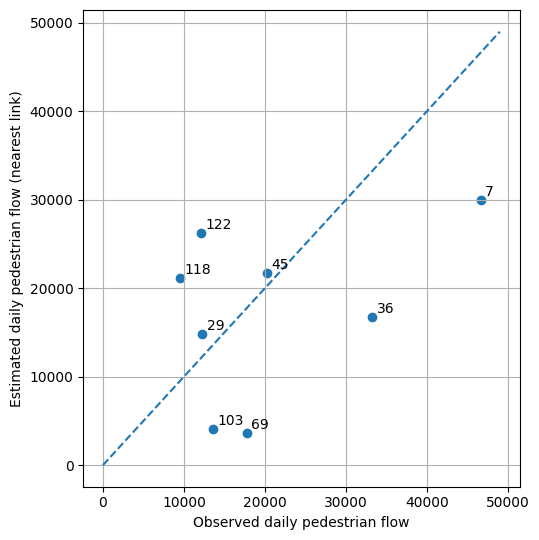

In [8]:
# New sites to append: Obtained from the City of Sydney open data hub
new_sites = [
    {"site_id": 36,  "name": "George St btw Martin Pl & Hunter (Site 36)",
     "lat": -33.8659311853659, "lon": 151.2072873379011, "observed": 33264, "period": "Oct 2023"},
    {"site_id": 122, "name": "Erskine St btw Clarence & Kent (Site 122)",
     "lat": -33.866744340368406, "lon": 151.2047069196685, "observed": 12090, "period": "Oct 2023"},
    {"site_id": 118, "name": "Bridge St btw Loftus & Pitt (Site 118)",
     "lat": -33.86355301628481, "lon": 151.20987169085447, "observed": 9552, "period": "Oct 2023"},
    {"site_id": 29,  "name": "Argyle St btw Harrington & George (Site 29)",
     "lat": -33.85910287617692, "lon": 151.20836771124794, "observed": 12282, "period": "Oct 2023"},
]

counts_csv     = "/content/ped_counts.csv"
counts_geojson = "/content/ped_counts.geojson"
matches_csv    = "/content/ped_validation_matches.csv"

# Load previous sites CSV (if exists) and append new
try:
    df_sites_old = pd.read_csv(counts_csv)
except Exception:
    df_sites_old = pd.DataFrame(columns=["site_id","name","lat","lon","observed","period"])

df_new = pd.DataFrame(new_sites)
df_sites = pd.concat([df_sites_old, df_new], ignore_index=True)

# Remove duplicates by site_id (keep the last occurrence)
df_sites = df_sites.drop_duplicates(subset=["site_id"], keep="last").reset_index(drop=True)

# Save updated CSV + GeoJSON
gdf_sites = gpd.GeoDataFrame(
    df_sites,
    geometry=gpd.points_from_xy(df_sites["lon"], df_sites["lat"]),
    crs="EPSG:4326"
)
df_sites.to_csv(counts_csv, index=False)
gdf_sites.to_file(counts_geojson, driver="GeoJSON")
print(f"Updated: {counts_csv} and {counts_geojson} ({len(gdf_sites)} sites)")

# Ensure the network GeoDataFrame `gdf` exists; reload if needed
if "gdf" not in globals():
    # Try local fallback first; then try 'raw_url' if it exists
    try:
        df_net = pd.read_csv("/content/link_flow.geojson.csv")
    except Exception:
        if "raw_url" in globals():
            df_net = pd.read_csv(raw_url)
        else:
            raise RuntimeError("Network file not found. Set 'raw_url' or update the local path to your CSV.")

    # Parse geometry from the _geojson column
    def parse_geojson(feature_str):
        s = str(feature_str).strip().strip("'").strip('"')
        try:
            f = json.loads(s)
        except json.JSONDecodeError:
            import ast
            f = ast.literal_eval(s)
        return shape(f["geometry"])

    df_net["geometry"] = df_net["_geojson"].apply(parse_geojson)
    gdf = gpd.GeoDataFrame(df_net, geometry="geometry", crs="EPSG:4326")

# Keep only lines
gdf_lines = gdf[gdf.geometry.geom_type.isin(["LineString","MultiLineString"])].copy()
if gdf_lines.crs is None:
    gdf_lines.set_crs("EPSG:4326", inplace=True, allow_override=True)

# Nearest link per site (project to metres first)
gdf_lines_m = gdf_lines.to_crs(3857)
gdf_sites_m = gdf_sites.to_crs(3857)

try:
    joined_m = gpd.sjoin_nearest(
        gdf_sites_m,
        gdf_lines_m[["geometry","flow"]],
        how="left",
        distance_col="dist_m"
    )
except Exception:
    # Fallback if sjoin_nearest unavailable
    from shapely.strtree import STRtree
    geoms = list(gdf_lines_m.geometry.values)
    tree  = STRtree(geoms)
    id_map = {id(geom): i for i, geom in enumerate(geoms)}
    idxs, dists = [], []
    for pt in gdf_sites_m.geometry:
        nearest_geom = tree.nearest(pt)
        idx = id_map[id(nearest_geom)]
        idxs.append(idx)
        dists.append(pt.distance(nearest_geom))
    joined_m = gdf_sites_m.copy()
    joined_m["dist_m"] = dists
    joined_m["flow"]   = gdf_lines_m.iloc[idxs]["flow"].values

joined = joined_m.to_crs(4326)

# Metrics
joined["est_flow"] = joined["flow"].astype(float)
joined["abs_err"]  = (joined["observed"] - joined["est_flow"]).abs()
joined["ape_%"]    = 100.0 * joined["abs_err"] / joined["observed"]

# R² (coefficient of determination)
obs = joined["observed"].astype(float).values
est = joined["est_flow"].astype(float).values
ss_res = ((obs - est)**2).sum()
ss_tot = ((obs - obs.mean())**2).sum() if len(obs) > 1 else 0.0

mape = float((joined["abs_err"] / joined["observed"]).mean() * 100.0)

# Save matches for auditing
joined.to_file(matches_csv.replace(".csv",".geojson"), driver="GeoJSON")
joined.drop(columns=["geometry"]).to_csv(matches_csv, index=False)
print(f"Saved matches: {matches_csv}")

# Show table
cols = ["site_id","name","period","observed","est_flow","dist_m","abs_err","ape_%","geometry"]
display(joined[cols].round({"est_flow":0,"dist_m":1,"abs_err":0,"ape_%":2}))

print(f"\nSummary over {len(joined)} sites → MAPE: {mape:.2f}%")

# Plot Observed vs Estimated
import matplotlib.pyplot as plt

plt.figure(figsize=(5.5,5.5))
plt.scatter(joined["observed"], joined["est_flow"])
lim = float(max(joined["observed"].max(), joined["est_flow"].max())) * 1.05
plt.plot([0, lim], [0, lim], linestyle="--")  # 1:1 line
for _, r in joined.iterrows():
    plt.annotate(str(int(r["site_id"])), (r["observed"], r["est_flow"]), xytext=(3,3), textcoords="offset points")
plt.xlabel("Observed daily pedestrian flow")
plt.ylabel("Estimated daily pedestrian flow (nearest link)")
plt.grid(True)
plt.tight_layout()
plt.show()


# **Combined map (network + observed sites)**
The joint map communicates both pattern and evidence. Links convey the modelled spatial structure through colour, width and opacity, while circles encode observed magnitudes with area proportional to counts and tooltips that include the nearest-link estimate. We use square-root radius scaling because people perceive marker area more than radius; √-scaling keeps visual area roughly proportional to counts and prevents a few large values from overwhelming the map.

In [9]:
# Ensure network and sites are loaded
# Network GeoDataFrame 'gdf' (EPSG:4326) with 'flow' column
if "gdf" not in globals():
    try:
        df_net = pd.read_csv("/content/link_flow.geojson.csv")
    except Exception:
        df_net = pd.read_csv(raw_url)  # uses the earlier Drive raw_url if set

    def parse_geojson(feature_str):
        s = str(feature_str).strip().strip("'").strip('"')
        try:
            f = json.loads(s)
        except json.JSONDecodeError:
            import ast
            f = ast.literal_eval(s)
        return shape(f["geometry"])

    df_net["geometry"] = df_net["_geojson"].apply(parse_geojson)
    gdf = gpd.GeoDataFrame(df_net, geometry="geometry", crs="EPSG:4326")

# Sites GeoDataFrame 'gdf_sites' (EPSG:4326) with 'observed' col
try:
    df_sites = pd.read_csv("/content/ped_counts.csv")
    gdf_sites = gpd.GeoDataFrame(
        df_sites,
        geometry=gpd.points_from_xy(df_sites["lon"], df_sites["lat"]),
        crs="EPSG:4326"
    )
except Exception as e:
    raise RuntimeError("Couldn't load /content/ped_counts.csv — run the previous cell that saves the sites first.") from e

# Find nearest link estimate per site (for tooltip)
gdf_lines = gdf[gdf.geometry.geom_type.isin(["LineString", "MultiLineString"])][["geometry", "flow"]].copy()
gdf_lines_m = gdf_lines.to_crs(3857)
gdf_sites_m = gdf_sites.to_crs(3857)

try:
    joined_m = gpd.sjoin_nearest(gdf_sites_m, gdf_lines_m, how="left", distance_col="dist_m")
except Exception:
    from shapely.strtree import STRtree
    geoms = list(gdf_lines_m.geometry.values)
    tree  = STRtree(geoms)
    id_map = {id(geom): i for i, geom in enumerate(geoms)}
    idxs, dists = [], []
    for pt in gdf_sites_m.geometry:
        ng = tree.nearest(pt)
        idx = id_map[id(ng)]
        idxs.append(idx)
        dists.append(pt.distance(ng))
    joined_m = gdf_sites_m.copy()
    joined_m["dist_m"] = dists
    joined_m["flow"]   = gdf_lines_m.iloc[idxs]["flow"].values

sites_with_est = joined_m.to_crs(4326).copy()
sites_with_est["est_flow"] = sites_with_est["flow"].astype(float)

# Build map
m = folium.Map(location=[-33.8688, 151.2093], zoom_start=14, tiles="cartodbpositron")

# Link styling: color by bins, width & opacity scale with flow
flow_min, flow_max = float(gdf_lines["flow"].min()), float(gdf_lines["flow"].max())
bins   = [0, 10, 1000, 5000, 10000, 50000, flow_max]
colors = ["#b8e186", "#66c2a5", "#208f8f", "#3b4cc0", "#45227c", "#2c105c"]
colormap = cm.StepColormap(colors, vmin=min(bins), vmax=max(bins), index=bins)

def width_from_flow(flow, min_w=1.2, max_w=7.0):
    if flow_max == flow_min:
        return (min_w + max_w) / 2
    return float(np.interp(flow, [flow_min, flow_max], [min_w, max_w]))

def alpha_from_flow(flow, min_a=0.35, max_a=0.95):
    if flow_max == flow_min:
        return (min_a + max_a) / 2
    return float(np.interp(flow, [flow_min, flow_max], [min_a, max_a]))

def add_link(m, geom, flow):
    if geom.is_empty:
        return
    lines = [geom] if geom.geom_type == "LineString" else (list(geom.geoms) if geom.geom_type == "MultiLineString" else [])
    w = width_from_flow(flow)
    a = alpha_from_flow(flow)
    for line in lines:
        coords = [(c[1], c[0]) for c in line.coords]   # (lat, lon), ignores Z
        folium.PolyLine(coords, color=colormap(flow), weight=w, opacity=a).add_to(m)

# Draw all links
for _, r in gdf_lines.iterrows():
    add_link(m, r.geometry, float(r.flow))

# Site circles: radius ∝ observed (pixel radius with √-scaling)
obs_min, obs_max = float(gdf_sites["observed"].min()), float(gdf_sites["observed"].max())
def radius_px_from_obs(obs, rmin=6, rmax=18):
    # √-scaling so circle AREA ~ observed
    if obs_max == obs_min:
        return (rmin + rmax) / 2
    return float(np.interp(np.sqrt(obs), [np.sqrt(obs_min), np.sqrt(obs_max)], [rmin, rmax]))

for _, s in sites_with_est.iterrows():
    lat, lon = float(s.geometry.y), float(s.geometry.x)
    r_px = radius_px_from_obs(float(s["observed"]))
    est  = s.get("est_flow", np.nan)
    tooltip = (
        f"{s['name']}<br>"
        f"Observed: {int(round(s['observed'])):,}<br>"
        f"Nearest-link est: {int(round(est)):,}" if pd.notna(est) else
        f"{s['name']}<br>Observed: {int(round(s['observed'])):,}"
    )
    folium.CircleMarker(
        location=(lat, lon),
        radius=r_px,
        color="#5A00B5",
        weight=1.5,
        fill=True,
        fill_color="#BF00FF",
        fill_opacity=0.65,
        tooltip=tooltip
    ).add_to(m)

# Legend for link colors (bins)
def fmt_k(n):
    n = float(n)
    return f"{int(round(n/1000))}k" if n >= 1000 else str(int(round(n)))

labels = []
for i in range(len(bins) - 1):
    if i < len(bins) - 2:
        labels.append(f"{fmt_k(bins[i])} – {fmt_k(bins[i+1])}")
    else:
        labels.append(f"{fmt_k(bins[i])}+")
legend_html = """
<div style="position: fixed; top: 20px; right: 20px;
     z-index:9999; font-size:14px; background-color:white;
     padding:10px; border:2px solid #999; border-radius:6px; box-shadow:0 1px 4px rgba(0,0,0,.2);">
     <b>Link Flow (daily)</b><br>
"""
for color, label in zip(colors, labels):
    legend_html += f'<div style="display:flex;align-items:center;margin:4px 0;"><span style="display:inline-block;width:18px;height:12px;background:{color};margin-right:8px;border:1px solid #ccc;"></span>{label}</div>'
legend_html += "<hr style='margin:6px 0;'><div>Site circle size ∝ observed</div></div>"
m.get_root().html.add_child(folium.Element(legend_html))

# Fit to sites
minx, miny, maxx, maxy = gdf_sites.total_bounds
m.fit_bounds([[miny, minx], [maxy, maxx]])

m  # or from IPython.display import display; display(m)

# **What the results say**
The maps show high pedestrian volumes along George St and around major hubs, as expected. The largest residuals occur at station forecourts and plazas, where the nearest-link match often spans tens of metres; these are likely matching artefacts or missing connectors rather than uniform bias. Across the sites tested here, the fit aligns with the study’s citywide validation (R² ≈ 0.79; MAPE ≈ 27%), with sensitivity to site selection and day type. Site-level errors should be interpreted alongside *dist_m*, directionality (bi-directional counters vs split links), and known gaps in the pedestrian network representation.

# **Where to go next?**
Improve matching by replacing pure nearest-link with place-aware snapping—search within reasonable distance along the same named street or within the same graph corridor. Where counters show high volumes but predictions lag, audit the network for missing links in the network such as arcades, stairs and underpasses, and add them if they affect connectivity; also re-check OD demand numbers. Finally, report MAPE and R² by sub-area (e.g., George St, Martin Place, Barangaroo) to focus calibration where urban form deviates from an assumed uniformity across the city.

❤️ If you found this tutorial useful, share it with a colleague or friend interested in geospatial and active transport data analytics and visualisation. It’s designed to upskill practitioners and students with a hands-on spatial analysis of pedestrian flow data, that are far less commonly found online.